#Descripción del Notebook de Procesamiento y Gráficas
##Realizado por: Erika Alexandra García Barrios

Este notebook fue el espacio de trabajo desarrollado en Python (usando librerías como matplotlib, seaborn y scikit-learn) para procesar los resultados de los experimentos y generar automáticamente los reportes visuales de la tesis.


Básicamente, el código se encargó de dos tareas clave:

Generar las curvas de evaluación: Tomó las predicciones de los modelos para calcular y dibujar de forma limpia las curvas ROC, Precision-Recall y las curvas de calibración probabilística (antes y después de aplicar la calibración isotónica).

Exportar las tablas como imágenes: Convirtió las matrices de confusión, los consolidados de las métricas clínicas (AUC, sensibilidad, especificidad) y los resúmenes de los experimentos en formatos de imagen listos para insertar directamente en el documento.

Cabe resaltar qué estas tablas fueron generadas con datos reales, actuales que reultaron del análisis individual de cada una de las gráficas de métricas de mi proyecto de grado.

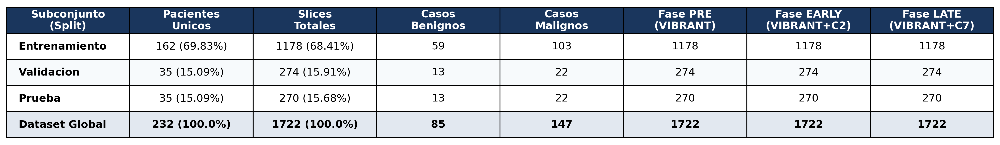

In [ ]:
import matplotlib.pyplot as plt

# Datos limpios para formato APA
data_splits = [
    ["Entrenamiento ", "162 (69.83%)", "1178 (68.41%)", "59", "103", "1178", "1178", "1178"],
    ["Validacion ", "35 (15.09%)", "274 (15.91%)", "13", "22", "274", "274", "274"],
    ["Prueba ", "35 (15.09%)", "270 (15.68%)", "13", "22", "270", "270", "270"],
    ["Dataset Global", "232 (100.0%)", "1722 (100.0%)", "85", "147", "1722", "1722", "1722"]
]

columns_splits = [
    "Subconjunto\n(Split)",
    "Pacientes\nUnicos",
    "Slices\nTotales",
    "Casos\nBenignos",
    "Casos\nMalignos",
    "Fase PRE\n(VIBRANT)",
    "Fase EARLY\n(VIBRANT+C2)",
    "Fase LATE\n(VIBRANT+C7)"
]

# Ajuste de tamaño ultra compacto (sin textos externos)
fig, ax = plt.subplots(figsize=(16, 2.2), dpi=300)
ax.axis('off')

table1 = ax.table(cellText=data_splits, colLabels=columns_splits, cellLoc='center', loc='center')
table1.auto_set_font_size(False)
table1.set_fontsize(12)
table1.scale(1.0, 2.0)

header_color = '#1A365D'
total_color = '#E2E8F0'
row_colors = ['#FFFFFF', '#F7FAFC', '#FFFFFF']

for (row, col), cell in table1.get_celld().items():
    cell.set_text_props(verticalalignment='center', horizontalalignment='center')
    if row == 0:
        cell.set_text_props(weight='bold', color='white')
        cell.set_facecolor(header_color)
    else:
        if row == len(data_splits):
            cell.set_facecolor(total_color)
            cell.set_text_props(weight='bold')
        else:
            cell.set_facecolor(row_colors[row-1])
        if col == 0:
            cell.set_text_props(weight='bold', horizontalalignment='left')

# Remoción absoluta de plt.figtext (Márgenes en cero)
plt.subplots_adjust(top=0.98, bottom=0.02, left=0.01, right=0.99)
plt.savefig("tabla_1_splits_apa.png", bbox_inches='tight', pad_inches=0.01, dpi=300)
plt.show()

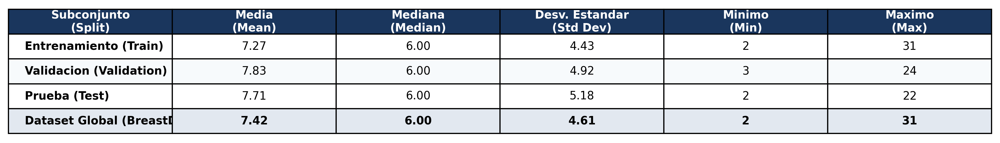

In [ ]:
import matplotlib.pyplot as plt

# Datos de la distribución de los splits
data_splits = [
    ["Entrenamiento (Train)", "162 (69.83%)", "1178 (68.41%)", "59", "103"],
    ["Validacion (Validation)", "35 (15.09%)", "274 (15.91%)", "13", "22"],
    ["Prueba (Test)", "35 (15.09%)", "270 (15.68%)", "13", "22"],
    ["DATASET GLOBAL", "232 (100.0%)", "1722 (100.0%)", "85", "147"]
]

columns_splits = [
    "Subconjunto\n(Split)",
    "Pacientes\nUnicos",
    "Slices\nTotales",
    "Casos\nBenignos",
    "Casos\nMalignos"
]

fig, ax = plt.subplots(figsize=(12, 3.2), dpi=300)
ax.axis('off')

table1 = ax.table(cellText=data_splits, colLabels=columns_splits, cellLoc='center', loc='center')
table1.auto_set_font_size(False)
table1.set_fontsize(10)
table1.scale(1.1, 2.2)

header_color = '#1A365D'
total_color = '#E2E8F0'
row_colors = ['#FFFFFF', '#F7FAFC', '#FFFFFF']

for (row, col), cell in table1.get_celld().items():
    cell.set_text_props(verticalalignment='center', horizontalalignment='center')
    if row == 0:
        cell.set_text_props(weight='bold', color='white')
        cell.set_facecolor(header_color)
    else:
        if row == len(data_splits):
            cell.set_facecolor(total_color)
            cell.set_text_props(weight='bold')
        else:
            cell.set_facecolor(row_colors[row-1])
        if col == 0:
            cell.set_text_props(weight='bold', horizontalalignment='left')

plt.figtext(0.5, 0.93, "TABLA 1: ESTRATIFICACION CLINICA Y DISTRIBUCION DE SPLITS (70 / 15 / 15)",
            fontsize=12, weight='bold', color='#1A365D', horizontalalignment='center')

plt.figtext(0.01, 0.05, "* Leakage Check: Train ∩ Val = 0  |  Train ∩ Test = 0  |  Val ∩ Test = 0  (Garantia de cero fuga de datos)",
            fontsize=8.5, style='italic', color='#2D3748')

plt.figtext(0.99, 0.05, "Tabla hecha con Python por Erika Alexandra Garcia Barrios",
            fontsize=8.5, style='italic', weight='bold', color='#1A365D', horizontalalignment='right')

plt.subplots_adjust(top=0.85, bottom=0.2, left=0.01, right=0.99)
plt.savefig("tabla_1_splits.png", bbox_inches='tight', pad_inches=0.03, dpi=300)
plt.show()


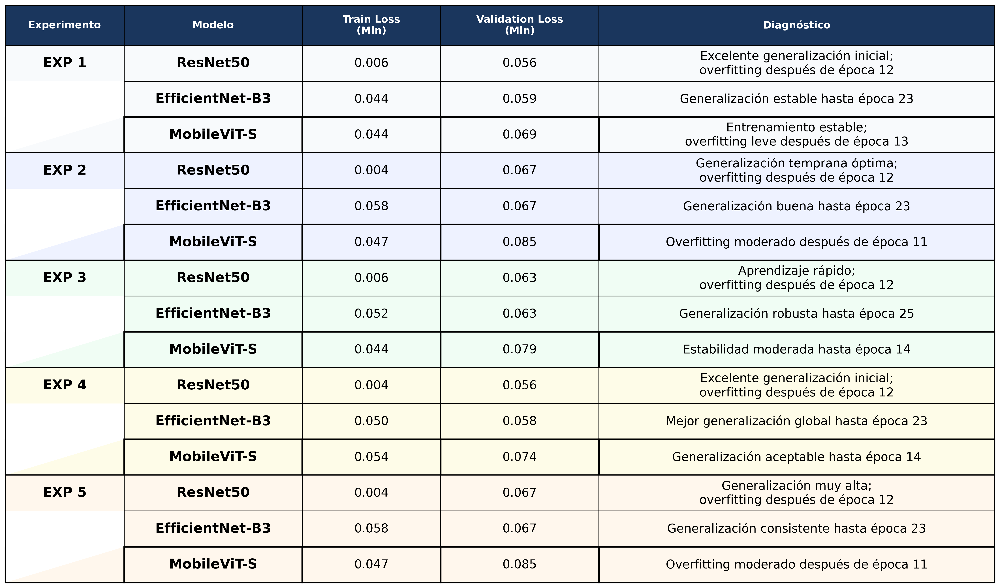

✅ Tabla exportada correctamente
📁 Archivo: tabla_loss_generalizacion_tesis.png
🔎 Texto optimizado para visualización en tesis


In [ ]:
import matplotlib.pyplot as plt

# ============================================================
# TABLA MEJORADA — LOSS Y GENERALIZACIÓN
# VERSIÓN TESIS — TEXTO LEGIBLE
# ============================================================

data_loss = [

    ["EXP 1", "ResNet50", "0.006", "0.056",
     "Excelente generalización inicial;\noverfitting después de época 12"],

    ["", "EfficientNet-B3", "0.044", "0.059",
     "Generalización estable hasta época 23"],

    ["", "MobileViT-S", "0.044", "0.069",
     "Entrenamiento estable;\noverfitting leve después de época 13"],


    ["EXP 2", "ResNet50", "0.004", "0.067",
     "Generalización temprana óptima;\noverfitting después de época 12"],

    ["", "EfficientNet-B3", "0.058", "0.067",
     "Generalización buena hasta época 23"],

    ["", "MobileViT-S", "0.047", "0.085",
     "Overfitting moderado después de época 11"],


    ["EXP 3", "ResNet50", "0.006", "0.063",
     "Aprendizaje rápido;\noverfitting después de época 12"],

    ["", "EfficientNet-B3", "0.052", "0.063",
     "Generalización robusta hasta época 25"],

    ["", "MobileViT-S", "0.044", "0.079",
     "Estabilidad moderada hasta época 14"],


    ["EXP 4", "ResNet50", "0.004", "0.056",
     "Excelente generalización inicial;\noverfitting después de época 12"],

    ["", "EfficientNet-B3", "0.050", "0.058",
     "Mejor generalización global hasta época 23"],

    ["", "MobileViT-S", "0.054", "0.074",
     "Generalización aceptable hasta época 14"],


    ["EXP 5", "ResNet50", "0.004", "0.067",
     "Generalización muy alta;\noverfitting después de época 12"],

    ["", "EfficientNet-B3", "0.058", "0.067",
     "Generalización consistente hasta época 23"],

    ["", "MobileViT-S", "0.047", "0.085",
     "Overfitting moderado después de época 11"],
]

columns_loss = [
    "Experimento",
    "Modelo",
    "Train Loss\n(Min)",
    "Validation Loss\n(Min)",
    "Diagnóstico"
]

# ============================================================
# FIGURA MÁS GRANDE Y LEGIBLE
# ============================================================

fig, ax = plt.subplots(
    figsize=(19, 10.5),
    dpi=300
)

ax.axis('off')

# ============================================================
# TABLA
# ============================================================

table = ax.table(
    cellText=data_loss,
    colLabels=columns_loss,
    cellLoc='center',
    loc='center'
)

# ============================================================
# TAMAÑO DE TEXTO — AUMENTADO
# ============================================================

table.auto_set_font_size(False)

# 🔥 TEXTO GENERAL MÁS GRANDE
table.set_fontsize(12)

# 🔥 MÁS ESPACIO VERTICAL
table.scale(1.12, 3.1)

# ============================================================
# COLORES
# ============================================================

header_color = '#1A365D'

exp_colors = [
    '#F8FAFC',  # EXP 1
    '#EEF2FF',  # EXP 2
    '#F0FDF4',  # EXP 3
    '#FEFCE8',  # EXP 4
    '#FFF7ED'   # EXP 5
]

# ============================================================
# ESTILO GENERAL
# ============================================================

for (row, col), cell in table.get_celld().items():

    cell.set_text_props(
        verticalalignment='center',
        horizontalalignment='center'
    )

    # ========================================================
    # HEADER
    # ========================================================

    if row == 0:

        cell.set_facecolor(header_color)

        cell.set_text_props(
            weight='bold',
            color='white',
            fontsize=13.5
        )

        cell.set_height(0.075)

    # ========================================================
    # CUERPO
    # ========================================================

    else:

        # Color por experimento
        exp_group = (row - 1) // 3
        cell.set_facecolor(exp_colors[exp_group])

        # Altura más grande
        cell.set_height(0.067)

        # Negrita columnas importantes
        if col in [0, 1]:

            cell.set_text_props(
                weight='bold',
                fontsize=18
            )

        else:

            cell.set_text_props(
                fontsize=16
            )

        # Diagnóstico más legible
        if col == 4:

            cell.set_text_props(
                fontsize=16
            )

# ============================================================
# SIMULACIÓN DE MERGE EN EXPERIMENTO
# ============================================================

for start_row in [1, 4, 7, 10, 13]:

    # Superior
    table[(start_row, 0)].visible_edges = 'LTR'

    # Medio
    table[(start_row + 1, 0)].visible_edges = 'LR'
    table[(start_row + 1, 0)].get_text().set_text('')

    # Inferior
    table[(start_row + 2, 0)].visible_edges = 'LBR'
    table[(start_row + 2, 0)].get_text().set_text('')

# ============================================================
# BORDES MÁS VISIBLES ENTRE EXPERIMENTOS
# ============================================================

for row in [3, 6, 9, 12, 15]:

    for col in range(len(columns_loss)):

        table[(row, col)].set_linewidth(2.0)

# ============================================================
# AJUSTE DE ANCHOS DE COLUMNA
# ============================================================

col_widths = {

    0: 0.12,   # Experimento
    1: 0.18,   # Modelo
    2: 0.14,   # Train Loss
    3: 0.16,   # Validation Loss
    4: 0.40    # Diagnóstico
}

for (row, col), cell in table.get_celld().items():

    if col in col_widths:

        cell.set_width(col_widths[col])

# ============================================================
# AJUSTE FINAL
# ============================================================

plt.subplots_adjust(
    top=0.97,
    bottom=0.03,
    left=0.02,
    right=0.98
)

# ============================================================
# EXPORTACIÓN FINAL
# ============================================================

plt.savefig(
    "tabla_loss_generalizacion_tesis.png",
    dpi=300,
    bbox_inches='tight',
    pad_inches=0.08,
    facecolor='white'
)

plt.show()

print("✅ Tabla exportada correctamente")
print("📁 Archivo: tabla_loss_generalizacion_tesis.png")
print("🔎 Texto optimizado para visualización en tesis")

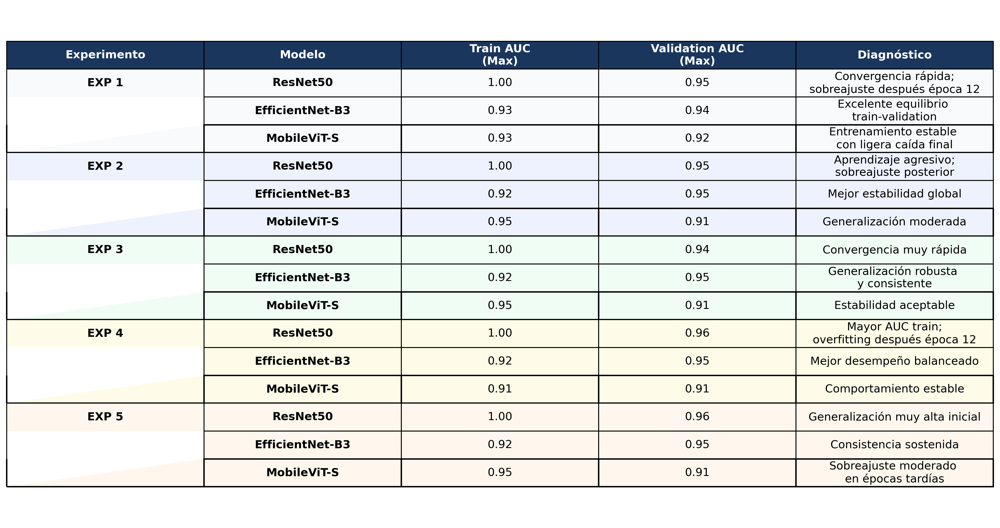

In [ ]:
import matplotlib.pyplot as plt

# ============================================================
# TABLA AUC TRAIN / VALIDATION — MISMO ESTILO DE LA PRIMERA
# ============================================================

data_auc = [

    ["EXP 1", "ResNet50", "1.00", "0.95",
     "Convergencia rápida;\nsobreajuste después época 12"],

    ["", "EfficientNet-B3", "0.93", "0.94",
     "Excelente equilibrio \ntrain-validation"],

    ["", "MobileViT-S", "0.93", "0.92",
     "Entrenamiento estable \ncon ligera caída final"],


    ["EXP 2", "ResNet50", "1.00", "0.95",
     "Aprendizaje agresivo;\nsobreajuste posterior"],

    ["", "EfficientNet-B3", "0.92", "0.95",
     "Mejor estabilidad global"],

    ["", "MobileViT-S", "0.95", "0.91",
     "Generalización moderada"],


    ["EXP 3", "ResNet50", "1.00", "0.94",
     "Convergencia muy rápida"],

    ["", "EfficientNet-B3", "0.92", "0.95",
     "Generalización robusta \ny consistente"],

    ["", "MobileViT-S", "0.95", "0.91",
     "Estabilidad aceptable"],


    ["EXP 4", "ResNet50", "1.00", "0.96",
     "Mayor AUC train;\noverfitting después época 12"],

    ["", "EfficientNet-B3", "0.92", "0.95",
     "Mejor desempeño balanceado"],

    ["", "MobileViT-S", "0.91", "0.91",
     "Comportamiento estable"],


    ["EXP 5", "ResNet50", "1.00", "0.96",
     "Generalización muy alta inicial"],

    ["", "EfficientNet-B3", "0.92", "0.95",
     "Consistencia sostenida"],

    ["", "MobileViT-S", "0.95", "0.91",
     "Sobreajuste moderado \nen épocas tardías"],
]

columns_auc = [
    "Experimento",
    "Modelo",
    "Train AUC\n(Max)",
    "Validation AUC\n(Max)",
    "Diagnóstico"
]

# ============================================================
# FIGURA
# ============================================================

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)
ax.axis('off')

table = ax.table(
    cellText=data_auc,
    colLabels=columns_auc,
    cellLoc='center',
    loc='center'
)

table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 2.)

# ============================================================
# COLORES
# ============================================================

header_color = '#1A365D'

exp_colors = [
    '#F8FAFC',  # EXP 1
    '#EEF2FF',  # EXP 2
    '#F0FDF4',  # EXP 3
    '#FEFCE8',  # EXP 4
    '#FFF7ED'   # EXP 5
]

# ============================================================
# ESTILO GENERAL
# ============================================================

for (row, col), cell in table.get_celld().items():

    cell.set_text_props(
        verticalalignment='center',
        horizontalalignment='center'
    )

    # HEADER
    if row == 0:

        cell.set_facecolor(header_color)
        cell.set_text_props(weight='bold', color='white')

    else:

        # Color por experimento
        exp_group = (row - 1) // 3
        cell.set_facecolor(exp_colors[exp_group])

        # Negrita columnas importantes
        if col in [0, 1]:
            cell.set_text_props(weight='bold')

# ============================================================
# SIMULACIÓN DE MERGE EN EXPERIMENTO
# ============================================================

for start_row in [1, 4, 7, 10, 13]:

    # Superior
    table[(start_row, 0)].visible_edges = 'LTR'

    # Medio
    table[(start_row + 1, 0)].visible_edges = 'LR'
    table[(start_row + 1, 0)].get_text().set_text('')

    # Inferior
    table[(start_row + 2, 0)].visible_edges = 'LBR'
    table[(start_row + 2, 0)].get_text().set_text('')

# ============================================================
# BORDES MÁS FUERTES ENTRE EXPERIMENTOS
# ============================================================

for row in [3, 6, 9, 12, 15]:

    for col in range(len(columns_auc)):

        table[(row, col)].set_linewidth(1.5)

# ============================================================
# AJUSTE FINAL
# ============================================================

plt.subplots_adjust(
    top=0.98,
    bottom=0.02,
    left=0.01,
    right=0.99
)

plt.savefig(
    "tabla_auc_generalizacion_mejorada.png",
    bbox_inches='tight',
    pad_inches=0.01,
    dpi=300
)

plt.show()

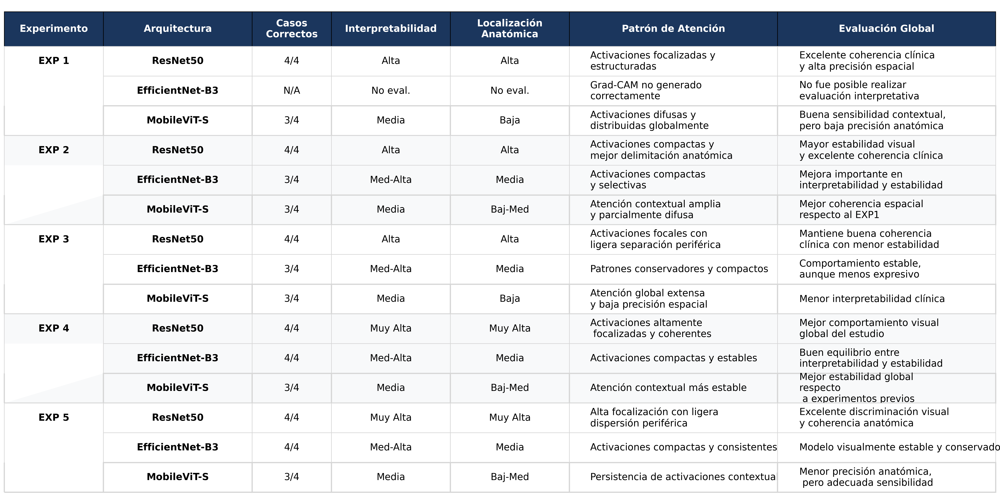

✅ Tabla exportada correctamente
📁 Archivo: tabla_gradcam_tesis.png
🔎 Optimizada para tesis / Word / PDF


In [ ]:
# ============================================================
# TABLA GRADCAM — VERSIÓN TESIS CORREGIDA
# SIN KALEIDO / TEXTO LEGIBLE / EXPORTACIÓN ESTABLE
# ============================================================

import matplotlib.pyplot as plt
import pandas as pd

# ============================================================
# DATOS
# ============================================================

data_gradcam = [

    ["EXP 1", "ResNet50", "4/4", "Alta", "Alta",
     "Activaciones focalizadas y \nestructuradas",
     "Excelente coherencia clínica \ny alta precisión espacial"],

    ["", "EfficientNet-B3", "N/A", "No eval.", "No eval.",
     "Grad-CAM no generado \ncorrectamente",
     "No fue posible realizar \nevaluación interpretativa"],

    ["", "MobileViT-S", "3/4", "Media", "Baja",
     "Activaciones difusas y \ndistribuidas globalmente",
     "Buena sensibilidad contextual, \npero baja precisión anatómica"],


    ["EXP 2", "ResNet50", "4/4", "Alta", "Alta",
     "Activaciones compactas y \nmejor delimitación anatómica",
     "Mayor estabilidad visual \ny excelente coherencia clínica"],

    ["", "EfficientNet-B3", "3/4", "Med-Alta", "Media",
     "Activaciones compactas \ny selectivas",
     "Mejora importante en \ninterpretabilidad y estabilidad"],

    ["", "MobileViT-S", "3/4", "Media", "Baj-Med",
     "Atención contextual amplia \ny parcialmente difusa",
     "Mejor coherencia espacial \nrespecto al EXP1"],


    ["EXP 3", "ResNet50", "4/4", "Alta", "Alta",
     "Activaciones focales con \nligera separación periférica",
     "Mantiene buena coherencia \nclínica con menor estabilidad"],

    ["", "EfficientNet-B3", "3/4", "Med-Alta", "Media",
     "Patrones conservadores y compactos",
     "Comportamiento estable, \naunque menos expresivo"],

    ["", "MobileViT-S", "3/4", "Media", "Baja",
     "Atención global extensa \ny baja precisión espacial",
     "Menor interpretabilidad clínica"],


    ["EXP 4", "ResNet50", "4/4", "Muy Alta", "Muy Alta",
     "Activaciones altamente\n focalizadas y coherentes",
     "Mejor comportamiento visual \nglobal del estudio"],

    ["", "EfficientNet-B3", "4/4", "Med-Alta", "Media",
     "Activaciones compactas y estables",
     "Buen equilibrio entre \ninterpretabilidad y estabilidad"],

    ["", "MobileViT-S", "3/4", "Media", "Baj-Med",
     "Atención contextual más estable",
     "Mejor estabilidad global \nrespecto\n a experimentos previos"],


    ["EXP 5", "ResNet50", "4/4", "Muy Alta", "Muy Alta",
     "Alta focalización con ligera \ndispersión periférica",
     "Excelente discriminación visual \ny coherencia anatómica"],

    ["", "EfficientNet-B3", "4/4", "Med-Alta", "Media",
     "Activaciones compactas y consistentes",
     "Modelo visualmente estable y conservador"],

    ["", "MobileViT-S", "3/4", "Media", "Baj-Med",
     "Persistencia de activaciones contextuales",
     "Menor precisión anatómica,\n pero adecuada sensibilidad"],
]

columns_gradcam = [

    "Experimento",
    "Arquitectura",
    "Casos\nCorrectos",
    "Interpretabilidad",
    "Localización\nAnatómica",
    "Patrón de Atención",
    "Evaluación Global"
]

df = pd.DataFrame(
    data_gradcam,
    columns=columns_gradcam
)

# ============================================================
# FIGURA GRANDE PARA TESIS
# ============================================================

fig, ax = plt.subplots(
    figsize=(24, 12),
    dpi=300
)

ax.axis('off')

# ============================================================
# TABLA
# ============================================================

table = ax.table(
    cellText=df.values,
    colLabels=df.columns,
    loc='center',
    cellLoc='center',
    colLoc='center'
)

# ============================================================
# TAMAÑO DE TEXTO
# ============================================================

table.auto_set_font_size(False)

# 🔥 TEXTO GENERAL MÁS GRANDE
table.set_fontsize(16)

# 🔥 MÁS ESPACIO VERTICAL
table.scale(1.18, 2.9)

# ============================================================
# COLORES
# ============================================================

header_color = '#1B365D'

exp_colors = [
    '#FFFFFF',
    '#F8F9FA',
    '#FFFFFF',
    '#F8F9FA',
    '#FFFFFF'
]

# ============================================================
# ESTILO GENERAL
# ============================================================

for (row, col), cell in table.get_celld().items():

    # ========================================================
    # HEADER
    # ========================================================Consolidado de pérdidas de entrenamiento, validación y comportamiento de generalización obtenidos durante los cinco experimentos


De manera general, las arquitecturas lograron converger correctamente, mostrando disminuciones progresivas de la función de pérdida durante las primeras épocas. Sin embargo, el comportamiento posterior fue diferente entre modelos.
ResNet50 alcanzó los menores valores de train loss en prácticamente todos los experimentos, evidenciando una alta capacidad de aprendizaje y adaptación sobre las representaciones multicanal DCE-MRI. Sin embargo, en varios experimentos comenzó a observarse un incremento progresivo de pérdida de validación después de aproximadamente la época 12, indicando aparición de sobreajuste. A pesar de ello, antes de este punto, el modelo presentó uno de los mejores comportamientos de generalización temprana de todo el estudio en todos los experimentos.
	EfficientNet-B3 mostró el comportamiento más estable entre entrenamiento y validación. Sus curvas de pérdida descendieron de manera más gradual y consistente, manteniendo diferencias relativamente pequeñas entre la pérdida de entrenamiento y la pérdida de validación, incluso en épocas avanzadas. Este comportamiento permitió evidenciar una mejor estabilidad global y menor tendencia al sobreajuste, especialmente entre las épocas 23 y 31, dependiendo del experimento evaluado.
	Por su parte, MobileViT-S presentó un comportamiento intermedio. Aunque logró convergencia estable durante las primeras épocas, posteriormente comenzó a evidenciar incrementos moderados en pérdida de validación, principalmente entre las épocas 11 y 14. Este comportamiento sugirió una capacidad de generalización aceptable, aunque menos estabilidad comparada con EfficientNet-B3, adicional, qué el modelo es muy grande para el tamaño de muestras.
	En conjunto, las curvas de pérdida permitieron identificar que las estrategias implementadas de normalización, aumentación de datos y transferencia de aprendizaje fueron efectivas para estabilizar el entrenamiento de los modelos sobre imágenes médicas DCE-MRI, permitiendo alcanzar convergencias consistentes y reduciendo el riesgo de colapso durante la optimización.


    if row == 0:

        cell.set_facecolor(header_color)

        cell.set_text_props(
            color='white',
            weight='bold',
            fontsize=16
        )

        cell.set_height(0.07)

    # ========================================================
    # CUERPO
    # ========================================================

    else:

        exp_group = (row - 1) // 3

        cell.set_facecolor(
            exp_colors[exp_group]
        )

        cell.set_edgecolor('#D6D6D6')

        cell.set_height(0.060)

        # Columnas descriptivas alineadas izquierda
        if col in [5, 6]:

            cell.set_text_props(
                fontsize=16,
                ha='left'
            )

        # Columnas compactas
        else:

            cell.set_text_props(
                fontsize=16,
                ha='center'
            )

        # Negrita en columnas clave
        if col in [0, 1]:

            cell.set_text_props(
                weight='bold'
            )

# ============================================================
# SIMULACIÓN DE MERGE
# ============================================================

for start_row in [1, 4, 7, 10, 13]:

    # Superior
    table[(start_row, 0)].visible_edges = 'LTR'

    # Medio
    table[(start_row + 1, 0)].visible_edges = 'LR'
    table[(start_row + 1, 0)].get_text().set_text('')

    # Inferior
    table[(start_row + 2, 0)].visible_edges = 'LBR'
    table[(start_row + 2, 0)].get_text().set_text('')

# ============================================================
# BORDES ENTRE EXPERIMENTOS
# ============================================================

for row in [3, 6, 9, 12, 15]:

    for col in range(len(columns_gradcam)):

        table[(row, col)].set_linewidth(2)

# ============================================================
# ANCHOS DE COLUMNAS
# ============================================================

col_widths = {

    0: 0.10,
    1: 0.15,
    2: 0.08,
    3: 0.12,
    4: 0.12,
    5: 0.21,
    6: 0.22
}

for (row, col), cell in table.get_celld().items():

    if col in col_widths:

        cell.set_width(
            col_widths[col]
        )

# ============================================================
# AJUSTE FINAL
# ============================================================

plt.subplots_adjust(
    left=0.02,
    right=0.98,
    top=0.98,
    bottom=0.02
)

# ============================================================
# EXPORTACIÓN PNG — SIN KALEIDO
# ============================================================

plt.savefig(
    "tabla_gradcam_tesis.png",
    dpi=300,
    bbox_inches='tight',
    pad_inches=0.08,
    facecolor='white'
)

plt.show()

print("✅ Tabla exportada correctamente")
print("📁 Archivo: tabla_gradcam_tesis.png")
print("🔎 Optimizada para tesis / Word / PDF")

In [ ]:
!pip install -U kaleido

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.6/55.6 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 kB 2.3 MB/s eta 0:00:00


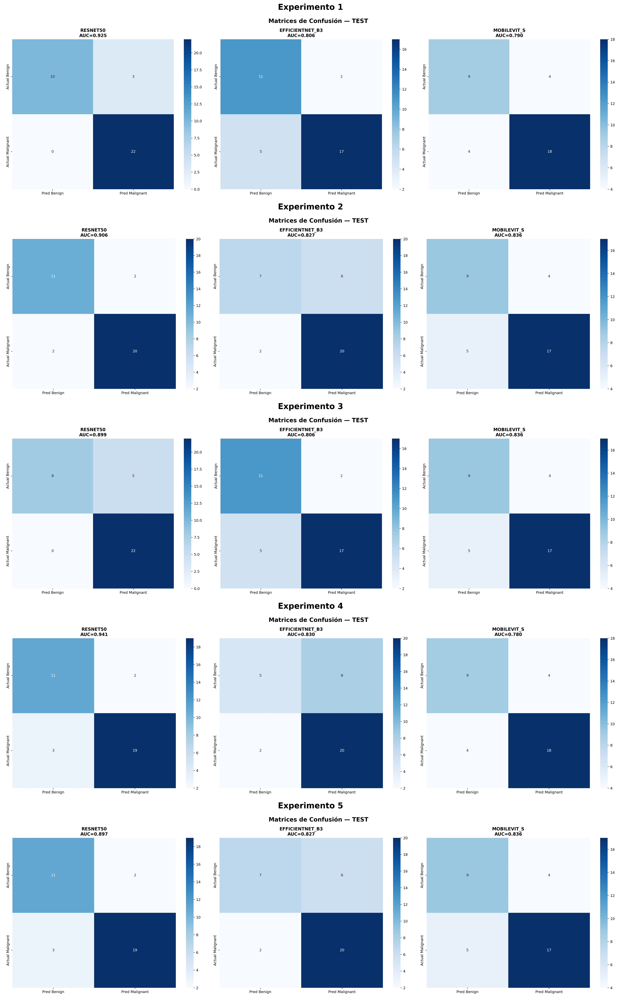

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# ============================================================
# CONFIGURACIÓN
# ============================================================

fig, axes = plt.subplots(
    nrows=5,
    ncols=1,
    figsize=(18, 28),
    dpi=300
)

# ============================================================
# LISTA DE IMÁGENES
# ============================================================

imagenes = [
    "M1.png",
    "M2.png",
    "M3.png",
    "M4.png",
    "M5.png"
]

titulos = [
    "Experimento 1",
    "Experimento 2",
    "Experimento 3",
    "Experimento 4",
    "Experimento 5"
]

# ============================================================
# CARGAR IMÁGENES
# ============================================================

for ax, img_path, titulo in zip(axes, imagenes, titulos):

    img = mpimg.imread(img_path)

    ax.imshow(img)

    ax.set_title(
        titulo,
        fontsize=16,
        fontweight='bold',
        pad=12
    )

    ax.axis('off')

# ============================================================
# AJUSTE FINAL
# ============================================================

plt.tight_layout()

plt.savefig(
    "matrices_confusion_consolidadas.png",
    bbox_inches='tight',
    pad_inches=0.02,
    dpi=300
)

plt.show()

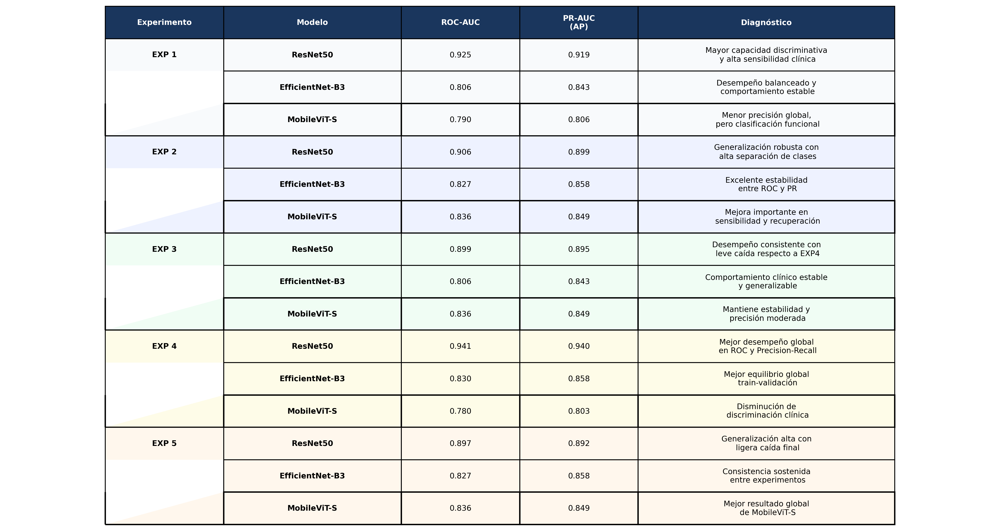

In [ ]:
import matplotlib.pyplot as plt

# ============================================================
# TABLA CONSOLIDADA — ROC-AUC Y PR-AUC
# VERSIÓN MEJORADA (texto ajustado y alineado)
# ============================================================

data_metrics = [

    ["EXP 1", "ResNet50", "0.925", "0.919",
     "Mayor capacidad discriminativa\n y alta sensibilidad clínica"],

    ["", "EfficientNet-B3", "0.806", "0.843",
     "Desempeño balanceado y\n comportamiento estable"],

    ["", "MobileViT-S", "0.790", "0.806",
     "Menor precisión global,\n pero clasificación funcional"],


    ["EXP 2", "ResNet50", "0.906", "0.899",
     "Generalización robusta con\n alta separación de clases"],

    ["", "EfficientNet-B3", "0.827", "0.858",
     "Excelente estabilidad\n entre ROC y PR"],

    ["", "MobileViT-S", "0.836", "0.849",
     "Mejora importante en\n sensibilidad y recuperación"],


    ["EXP 3", "ResNet50", "0.899", "0.895",
     "Desempeño consistente con\n leve caída respecto a EXP4"],

    ["", "EfficientNet-B3", "0.806", "0.843",
     "Comportamiento clínico estable\n y generalizable"],

    ["", "MobileViT-S", "0.836", "0.849",
     "Mantiene estabilidad y\n precisión moderada"],


    ["EXP 4", "ResNet50", "0.941", "0.940",
     "Mejor desempeño global\n en ROC y Precision-Recall"],

    ["", "EfficientNet-B3", "0.830", "0.858",
     "Mejor equilibrio global\n train-validación"],

    ["", "MobileViT-S", "0.780", "0.803",
     "Disminución de\n discriminación clínica"],


    ["EXP 5", "ResNet50", "0.897", "0.892",
     "Generalización alta con\n ligera caída final"],

    ["", "EfficientNet-B3", "0.827", "0.858",
     "Consistencia sostenida\n entre experimentos"],

    ["", "MobileViT-S", "0.836", "0.849",
     "Mejor resultado global\n de MobileViT-S"],
]

# ============================================================
# COLUMNAS
# ============================================================

columns_metrics = [
    "Experimento",
    "Modelo",
    "ROC-AUC",
    "PR-AUC\n(AP)",
    "Diagnóstico"
]

# ============================================================
# FIGURA
# ============================================================

fig, ax = plt.subplots(figsize=(15.5, 8), dpi=300)
ax.axis('off')

table = ax.table(
    cellText=data_metrics,
    colLabels=columns_metrics,
    cellLoc='center',
    loc='center',

    # AJUSTE DE ANCHOS
    colWidths=[0.12, 0.18, 0.12, 0.12, 0.26]
)

# ============================================================
# FORMATO GENERAL
# ============================================================

table.auto_set_font_size(False)
table.set_fontsize(8.5)
table.scale(1, 2.4)

# ============================================================
# COLORES
# ============================================================

header_color = '#1A365D'

exp_colors = [
    '#F8FAFC',  # EXP 1
    '#EEF2FF',  # EXP 2
    '#F0FDF4',  # EXP 3
    '#FEFCE8',  # EXP 4
    '#FFF7ED'   # EXP 5
]

# ============================================================
# ESTILO CELDAS
# ============================================================

for (row, col), cell in table.get_celld().items():

    # HEADER
    if row == 0:

        cell.set_facecolor(header_color)
        cell.set_text_props(
            weight='bold',
            color='white',
            ha='center',
            va='center'
        )

    else:

        exp_group = (row - 1) // 3
        cell.set_facecolor(exp_colors[exp_group])

        # CENTRADO GENERAL
        cell.set_text_props(
            va='center',
            ha='center'
        )

        # NEGRITA COLUMNAS IMPORTANTES
        if col in [0, 1]:
            cell.set_text_props(weight='bold')

        # AJUSTE TEXTO DIAGNÓSTICO
        if col == 4:
            cell.set_text_props(
                ha='center',
                va='center'
            )

# ============================================================
# SIMULACIÓN MERGE EXPERIMENTOS
# ============================================================

for start_row in [1, 4, 7, 10, 13]:

    # Superior
    table[(start_row, 0)].visible_edges = 'LTR'

    # Medio
    table[(start_row + 1, 0)].visible_edges = 'LR'
    table[(start_row + 1, 0)].get_text().set_text('')

    # Inferior
    table[(start_row + 2, 0)].visible_edges = 'LBR'
    table[(start_row + 2, 0)].get_text().set_text('')

# ============================================================
# BORDES MÁS FUERTES ENTRE EXPERIMENTOS
# ============================================================

for row in [3, 6, 9, 12, 15]:

    for col in range(len(columns_metrics)):

        table[(row, col)].set_linewidth(1.5)

# ============================================================
# AJUSTES FINALES
# ============================================================

plt.subplots_adjust(
    top=0.98,
    bottom=0.02,
    left=0.01,
    right=0.99
)

plt.savefig(
    "tabla_consolidada_roc_pr_mejorada.png",
    bbox_inches='tight',
    pad_inches=0.01,
    dpi=300
)

plt.show()

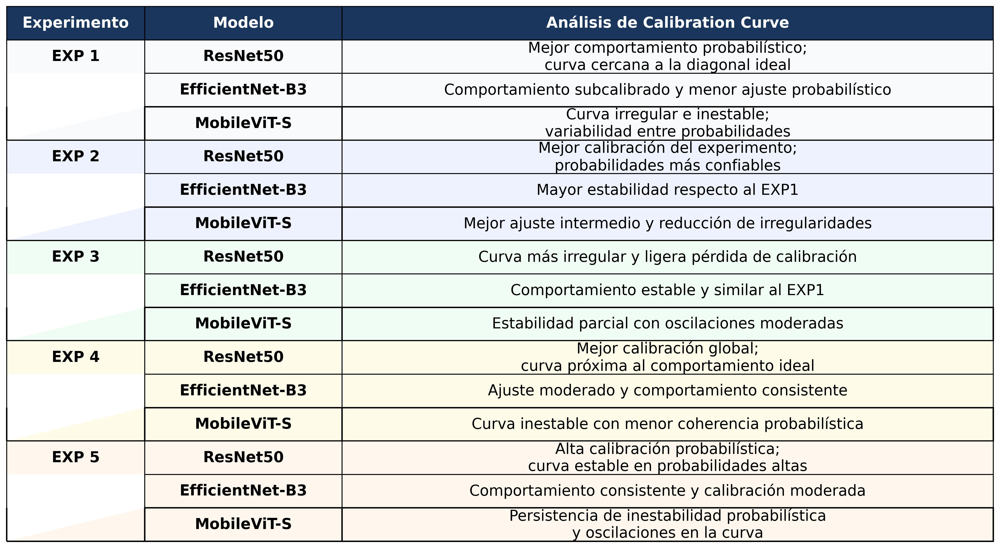

In [ ]:
import matplotlib.pyplot as plt

# ============================================================
# TABLA CONSOLIDADA — CALIBRATION CURVE (ISOTONIC)
# ============================================================

data_calibration = [

    # ========================================================
    # EXP 1
    # ========================================================

    ["EXP 1", "ResNet50",
     "Mejor comportamiento probabilístico;\ncurva cercana a la diagonal ideal"],

    ["", "EfficientNet-B3",
     "Comportamiento subcalibrado y menor ajuste probabilístico"],

    ["", "MobileViT-S",
     "Curva irregular e inestable;\nvariabilidad entre probabilidades"],


    # ========================================================
    # EXP 2
    # ========================================================

    ["EXP 2", "ResNet50",
     "Mejor calibración del experimento;\nprobabilidades más confiables"],

    ["", "EfficientNet-B3",
     "Mayor estabilidad respecto al EXP1"],

    ["", "MobileViT-S",
     "Mejor ajuste intermedio y reducción de irregularidades"],


    # ========================================================
    # EXP 3
    # ========================================================

    ["EXP 3", "ResNet50",
     "Curva más irregular y ligera pérdida de calibración"],

    ["", "EfficientNet-B3",
     "Comportamiento estable y similar al EXP1"],

    ["", "MobileViT-S",
     "Estabilidad parcial con oscilaciones moderadas"],


    # ========================================================
    # EXP 4
    # ========================================================

    ["EXP 4", "ResNet50",
     "Mejor calibración global;\ncurva próxima al comportamiento ideal"],

    ["", "EfficientNet-B3",
     "Ajuste moderado y comportamiento consistente"],

    ["", "MobileViT-S",
     "Curva inestable con menor coherencia probabilística"],


    # ========================================================
    # EXP 5
    # ========================================================

    ["EXP 5", "ResNet50",
     "Alta calibración probabilística;\ncurva estable en probabilidades altas"],

    ["", "EfficientNet-B3",
     "Comportamiento consistente y calibración moderada"],

    ["", "MobileViT-S",
     "Persistencia de inestabilidad probabilística\ny oscilaciones en la curva"],
]

# ============================================================
# COLUMNAS
# ============================================================

columns_calibration = [
    "Experimento",
    "Modelo",
    "Análisis de Calibration Curve"
]

# ============================================================
# FIGURA
# ============================================================

fig, ax = plt.subplots(figsize=(15, 7.5), dpi=300)
ax.axis('off')

table = ax.table(
    cellText=data_calibration,
    colLabels=columns_calibration,
    cellLoc='center',
    loc='center',

    # AJUSTE DE COLUMNAS
    colWidths=[0.14, 0.20, 0.66]
)

# ============================================================
# FORMATO GENERAL
# ============================================================

table.auto_set_font_size(False)
table.set_fontsize(16)
table.scale(1, 2.4)

# ============================================================
# COLORES
# ============================================================

header_color = '#1A365D'

exp_colors = [
    '#F8FAFC',  # EXP 1
    '#EEF2FF',  # EXP 2
    '#F0FDF4',  # EXP 3
    '#FEFCE8',  # EXP 4
    '#FFF7ED'   # EXP 5
]

# ============================================================
# ESTILO CELDAS
# ============================================================

for (row, col), cell in table.get_celld().items():

    if row == 0:

        cell.set_facecolor(header_color)
        cell.set_text_props(
            weight='bold',
            color='white',
            ha='center',
            va='center'
        )

    else:

        exp_group = (row - 1) // 3
        cell.set_facecolor(exp_colors[exp_group])

        cell.set_text_props(
            va='center',
            ha='center'
        )

        # Negrita columnas importantes
        if col in [0, 1]:
            cell.set_text_props(weight='bold')

# ============================================================
# SIMULACIÓN DE MERGE EN EXPERIMENTO
# ============================================================

for start_row in [1, 4, 7, 10, 13]:

    # Superior
    table[(start_row, 0)].visible_edges = 'LTR'

    # Medio
    table[(start_row + 1, 0)].visible_edges = 'LR'
    table[(start_row + 1, 0)].get_text().set_text('')

    # Inferior
    table[(start_row + 2, 0)].visible_edges = 'LBR'
    table[(start_row + 2, 0)].get_text().set_text('')

# ============================================================
# BORDES ENTRE EXPERIMENTOS
# ============================================================

for row in [3, 6, 9, 12, 15]:

    for col in range(len(columns_calibration)):

        table[(row, col)].set_linewidth(1.5)

# ============================================================
# AJUSTES FINALES
# ============================================================

plt.subplots_adjust(
    top=0.98,
    bottom=0.02,
    left=0.01,
    right=0.99
)

plt.savefig(
    "tabla_calibration_curve_consolidada.png",
    bbox_inches='tight',
    pad_inches=0.01,
    dpi=300
)

plt.show()

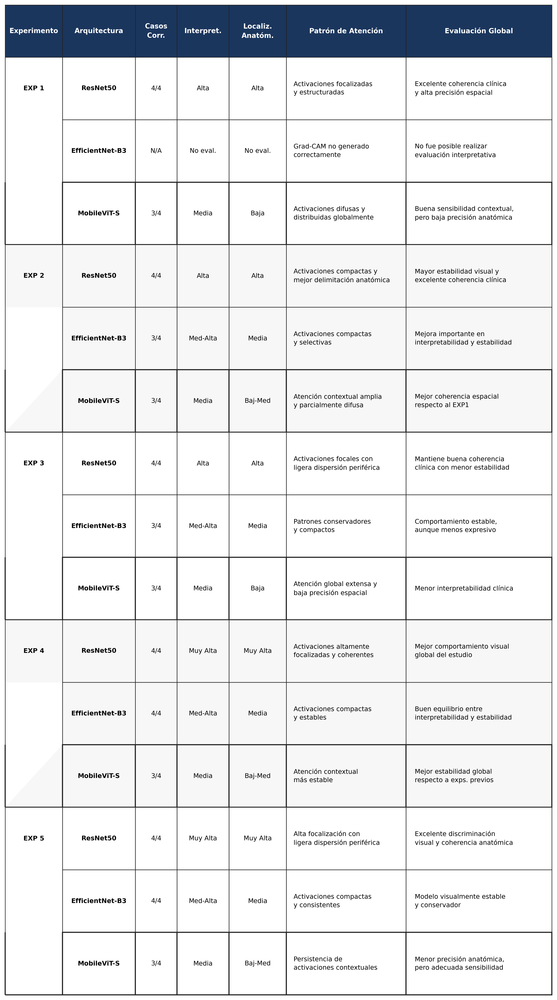

In [ ]:
import matplotlib.pyplot as plt

# ============================================================
# FIGURA
# ============================================================
fig, ax = plt.subplots(figsize=(10.5, 14), dpi=300)
ax.axis('off')

# ============================================================
# TABLA
# ============================================================
col_widths = [0.11, 0.14, 0.08, 0.10, 0.11, 0.23, 0.28]

table = ax.table(
    cellText=data_gradcam,
    colLabels=columns_gradcam,
    cellLoc='center',
    loc='center',
    colWidths=col_widths
)

# ============================================================
# FUENTE
# ============================================================
table.auto_set_font_size(False)
table.set_fontsize(9)

# ============================================================
# ALTURAS DINÁMICAS
# ============================================================
base_height_per_line = 0.030
padding_vertical = 0.030

# HEADER
for col in range(len(columns_gradcam)):
    table[(0, col)].set_height(0.075)

# FILAS
for row_idx, row_data in enumerate(data_gradcam):
    actual_row = row_idx + 1
    max_lines = 1

    for cell_text in row_data:
        lines = len(str(cell_text).split('\n'))
        max_lines = max(max_lines, lines)

    calculated_height = (
        max_lines * base_height_per_line
    ) + padding_vertical

    for col in range(len(columns_gradcam)):
        table[(actual_row, col)].set_height(calculated_height)

# ============================================================
# ESTILO GENERAL
# ============================================================
header_color = '#1B365D'
exp_colors = ['#FFFFFF', '#F7F7F7']

for (row, col), cell in table.get_celld().items():

    # Bordes más limpios
    cell.set_edgecolor('#222222')

    # Espesor normal
    cell.set_linewidth(0.8)

    # Espaciado interno
    cell.PAD = 0.06

    text = cell.get_text()

    # Mejor interlineado
    text.set_linespacing(1.45)

    if row == 0:

        cell.set_facecolor(header_color)

        text.set_color('white')
        text.set_weight('bold')
        text.set_fontsize(9.5)

        text.set_ha('center')
        text.set_va('center')

    else:

        exp_group = ((row - 1) // 3) % 2
        cell.set_facecolor(exp_colors[exp_group])

        # ====================================================
        # COLUMNAS LARGAS
        # ====================================================
        if col in [5, 6]:

            text.set_ha('left')
            text.set_va('center')

            # Separación respecto al borde izquierdo
            text.set_x(0.05)

        else:
            text.set_ha('center')
            text.set_va('center')

        # Bold en columnas importantes
        if col in [0, 1]:
            text.set_weight('bold')

# ============================================================
# MERGE VISUAL EXPERIMENTOS
# ============================================================
for start_row in [1, 4, 7, 10, 13]:

    table[(start_row, 0)].visible_edges = 'LTR'
    table[(start_row + 1, 0)].visible_edges = 'LR'
    table[(start_row + 2, 0)].visible_edges = 'LBR'

    table[(start_row + 1, 0)].get_text().set_text('')
    table[(start_row + 2, 0)].get_text().set_text('')

# ============================================================
# SEPARADORES ENTRE EXPERIMENTOS
# ============================================================
for row in [3, 6, 9, 12, 15]:
    for col in range(len(columns_gradcam)):
        table[(row, col)].set_linewidth(1.5)

# ============================================================
# AJUSTES FINALES
# ============================================================
plt.subplots_adjust(
    left=0.02,
    right=0.98,
    top=0.98,
    bottom=0.02
)

plt.savefig(
    "tabla_gradcam_final.png",
    dpi=300,
    bbox_inches='tight',
    pad_inches=0.08
)

plt.show()

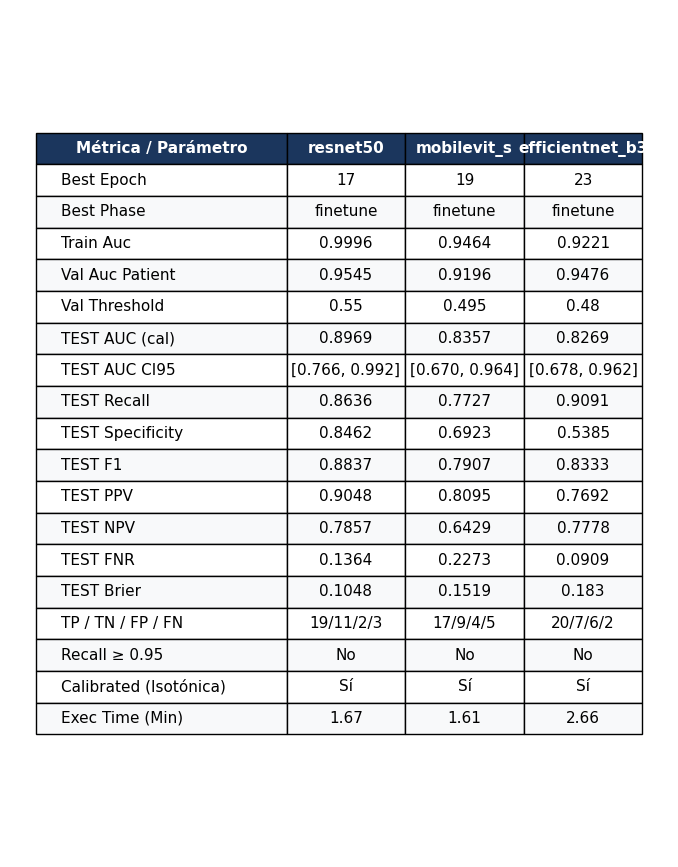

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Datos del experimento 4 (Simplificando el texto de calibración)
data = {
    "Model": ["resnet50", "mobilevit_s", "efficientnet_b3"],
    "Best Epoch": [17, 19, 23],
    "Best Phase": ["finetune", "finetune", "finetune"],
    "Train AUC": [0.9996, 0.9464, 0.9221],
    "Val AUC Patient": [0.9545, 0.9196, 0.9476],
    "Val Threshold": [0.55, 0.495, 0.48],
    "TEST AUC (cal)": [0.8969, 0.8357, 0.8269],
    "TEST AUC CI95": ["[0.766, 0.992]", "[0.670, 0.964]", "[0.678, 0.962]"],
    "TEST Recall": [0.8636, 0.7727, 0.9091],
    "TEST Specificity": [0.8462, 0.6923, 0.5385],
    "TEST F1": [0.8837, 0.7907, 0.8333],
    "TEST PPV": [0.9048, 0.8095, 0.7692],
    "TEST NPV": [0.7857, 0.6429, 0.7778],
    "TEST FNR": [0.1364, 0.2273, 0.0909],
    "TEST Brier": [0.1048, 0.1519, 0.1830],
    "TP / TN / FP / FN": ["19/11/2/3", "17/9/4/5", "20/7/6/2"],
    "Recall ≥ 0.95": ["No", "No", "No"],
    "Calibrated (Isotónica)": [
        "Sí",
        "Sí",
        "Sí",
    ],  # Texto corto que no desborda la celda
    "Exec Time (min)": [1.67, 1.61, 2.66],
}

df_original = pd.DataFrame(data)

# 2. Formatear nombres de columnas
df_original.columns = [col.replace("_", " ").title() for col in df_original.columns]
df_original.rename(
    columns={
        "Test Auc (Cal)": "TEST AUC (cal)",
        "Test Auc Ci95": "TEST AUC CI95",
        "Test Recall": "TEST Recall",
        "Test Specificity": "TEST Specificity",
        "Test F1": "TEST F1",
        "Test Ppv": "TEST PPV",
        "Test Npv": "TEST NPV",
        "Test Fnr": "TEST FNR",
        "Test Brier": "TEST Brier",
        "Tp / Tn / Fp / Fn": "TP / TN / FP / FN",
        "Recall ≥ 0.95": "Recall ≥ 0.95",
        "Calibrated (Isotónica)": "Calibrated (Isotónica)",
    },
    inplace=True,
)

# Transponer para la vista vertical
df_transposed = df_original.set_index("Model").T.reset_index()
df_transposed.rename(columns={"index": "Métrica / Parámetro"}, inplace=True)

# 3. Configurar figura tamaño carta vertical
fig, ax = plt.subplots(figsize=(8.5, 11))
ax.axis("off")
ax.axis("tight")

# 4. Dibujar tabla
tabla = ax.table(
    cellText=df_transposed.values,
    colLabels=df_transposed.columns,
    cellLoc="center",
    loc="center",
)

# 5. Estilos y dimensiones de celdas
tabla.auto_set_font_size(False)
tabla.set_fontsize(11)
tabla.scale(1.2, 1.9)  # Ajuste de altura interna

# Control estricto de anchos para que encaje perfecto en el margen de la página
for row in range(len(df_transposed) + 1):
    tabla[row, 0].set_width(0.38)  # Un toque más de espacio para los textos
    for col in range(1, 4):
        tabla[row, col].set_width(0.18)

# Colores institucionales y alineación
for (row, col), cell in tabla.get_celld().items():
    if row == 0:
        cell.set_text_props(weight="bold", color="white")
        cell.set_facecolor("#1B365D")
    else:
        if row % 2 == 0:
            cell.set_facecolor("#F8F9FA")
        else:
            cell.set_facecolor("white")

        # Mantener los nombres de las métricas alineados a la izquierda para mejor lectura
        if col == 0:
            cell.set_text_props(ha="left")

# 6. Guardar la nueva versión limpia
plt.savefig(
    "tabla_monografia_limpia.png",
    bbox_inches="tight",
    dpi=300,
    transparent=False,
)
plt.show()

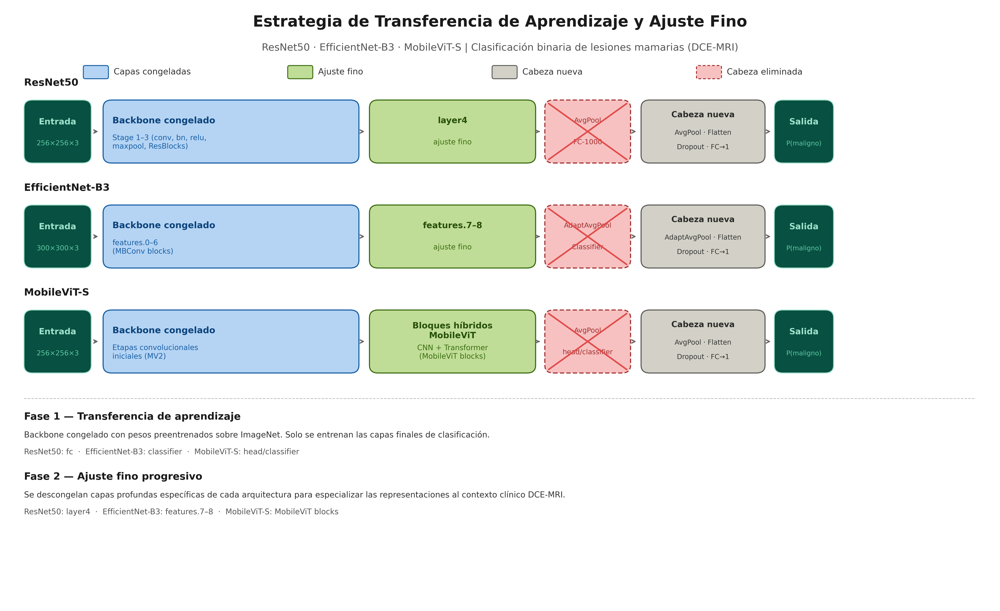

✅ Guardado: transfer_learning_diagram_final.png


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import FancyBboxPatch

# ═════════════════════════════════════════════════════════════════════════════
# FIGURA — TRANSFER LEARNING Y FINE TUNING
# VERSIÓN TESIS FINAL
# ═════════════════════════════════════════════════════════════════════════════

# ─────────────────────────────────────────────────────────────────────────────
# COLORES
# ─────────────────────────────────────────────────────────────────────────────
C_FROZEN = "#B5D4F4"
C_FROZEN_BD = "#185FA5"

C_FT = "#C0DD97"
C_FT_BD = "#3B6D11"

C_NEWHEAD = "#D3D1C7"
C_NEWHEAD_BD = "#5F5E5A"

C_DELHEAD = "#F7C1C1"
C_DELHEAD_BD = "#A32D2D"

C_INPUT = "#085041"
C_INPUT_TXT = "#9FE1CB"

C_TXT_DARK = "#1A1A1A"
C_TXT_MID = "#333333"
C_TXT_SUB = "#555555"

C_ARROW = "#666666"

# ─────────────────────────────────────────────────────────────────────────────
# CONFIG FIGURA
# ─────────────────────────────────────────────────────────────────────────────
FIG_W = 18
FIG_H = 11
DPI = 300

fig, ax = plt.subplots(figsize=(FIG_W, FIG_H), dpi=DPI)

ax.set_xlim(0, 15)
ax.set_ylim(0, 10)

ax.axis('off')

fig.patch.set_facecolor('white')
ax.set_facecolor('white')

# ─────────────────────────────────────────────────────────────────────────────
# HELPERS
# ─────────────────────────────────────────────────────────────────────────────
def box(
    ax,
    x,
    y,
    w,
    h,
    fc,
    ec,
    lw=1.5,
    dash=False,
    radius=0.13
):

    ls = (0, (4, 2)) if dash else 'solid'

    ax.add_patch(
        FancyBboxPatch(
            (x, y),
            w,
            h,
            boxstyle=f"round,pad=0,rounding_size={radius}",
            facecolor=fc,
            edgecolor=ec,
            linewidth=lw,
            linestyle=ls,
            zorder=3
        )
    )


def txt(
    ax,
    x,
    y,
    s,
    size=11,
    weight='normal',
    color=C_TXT_DARK,
    ha='center',
    va='center'
):

    ax.text(
        x,
        y,
        s,
        fontsize=size,
        fontweight=weight,
        color=color,
        ha=ha,
        va=va,
        zorder=4
    )


def arrow(ax, x1, y1, x2, y2):

    ax.annotate(
        '',
        xy=(x2, y2),
        xytext=(x1, y1),
        arrowprops=dict(
            arrowstyle='->',
            color=C_ARROW,
            lw=1.6
        ),
        zorder=5
    )


def cross(ax, x, y, w, h):

    ax.plot(
        [x, x+w],
        [y+h, y],
        color='#E24B4A',
        lw=2,
        zorder=5
    )

    ax.plot(
        [x, x+w],
        [y, y+h],
        color='#E24B4A',
        lw=2,
        zorder=5
    )

# ─────────────────────────────────────────────────────────────────────────────
# TÍTULO
# ─────────────────────────────────────────────────────────────────────────────
ax.text(
    7.5,
    9.65,
    "Estrategia de Transferencia de Aprendizaje y Ajuste Fino",
    fontsize=20,
    fontweight='bold',
    color=C_TXT_DARK,
    ha='center'
)

ax.text(
    7.5,
    9.25,
    "ResNet50 · EfficientNet-B3 · MobileViT-S | Clasificación binaria de lesiones mamarias (DCE-MRI)",
    fontsize=13,
    color=C_TXT_SUB,
    ha='center'
)

# ─────────────────────────────────────────────────────────────────────────────
# LEYENDA
# ─────────────────────────────────────────────────────────────────────────────
legend_items = [

    (C_FROZEN,  C_FROZEN_BD,  'Capas congeladas', False),
    (C_FT,      C_FT_BD,      'Ajuste fino', False),
    (C_NEWHEAD, C_NEWHEAD_BD, 'Cabeza nueva', False),
    (C_DELHEAD, C_DELHEAD_BD, 'Cabeza eliminada', True),
]

lx = 1.4

for fc, ec, label, dash in legend_items:

    ls = (0, (3, 2)) if dash else 'solid'

    ax.add_patch(

        mpatches.FancyBboxPatch(

            (lx-0.22, 8.78),
            0.38,
            0.22,

            boxstyle="round,pad=0,rounding_size=0.03",

            facecolor=fc,
            edgecolor=ec,
            lw=1.2,
            linestyle=ls,
            zorder=3
        )
    )

    ax.text(
        lx+0.24,
        8.89,
        label,
        fontsize=11,
        color=C_TXT_MID,
        ha='left',
        va='center'
    )

    lx += 3.1

# ─────────────────────────────────────────────────────────────────────────────
# DATOS REALES DEL EXPERIMENTO
# ─────────────────────────────────────────────────────────────────────────────
rows = [

    (
        "ResNet50",
        "256×256×3",

        "Backbone congelado",
        "Stage 1–3 (conv, bn, relu,\nmaxpool, ResBlocks)",

        "layer4",
        "ajuste fino",

        "AvgPool",
        "FC-1000",

        "AvgPool · Flatten\nDropout · FC→1",

        7.90
    ),

    (
        "EfficientNet-B3",
        "300×300×3",

        "Backbone congelado",
        "features.0–6\n(MBConv blocks)",

        "features.7–8",
        "ajuste fino",

        "AdaptAvgPool",
        "Classifier",

        "AdaptAvgPool · Flatten\nDropout · FC→1",

        6.15
    ),

    (
        "MobileViT-S",
        "256×256×3",

        "Backbone congelado",
        "Etapas convolucionales\niniciales (MV2)",

        "Bloques híbridos\nMobileViT",

        "CNN + Transformer\n(MobileViT blocks)",

        "AvgPool",
        "head/classifier",

        "AvgPool · Flatten\nDropout · FC→1",

        4.40
    ),
]

# ─────────────────────────────────────────────────────────────────────────────
# POSICIONES
# ─────────────────────────────────────────────────────────────────────────────
BOX_H = 1.05

ENTRY_X = 0.28
ENTRY_W = 1.02

BB_X = 1.48
BB_W = 3.88

FT_X = 5.52
FT_W = 2.52

DH_X = 8.18
DH_W = 1.30

NH_X = 9.64
NH_W = 1.88

OUT_X = 11.66
OUT_W = 0.90

# ─────────────────────────────────────────────────────────────────────────────
# RENDER
# ─────────────────────────────────────────────────────────────────────────────
for arch, inp, bb_lbl, bb_det, ft_lbl, ft_det, dh1, dh2, nh_det, yc in rows:

    yb = yc - BOX_H/2

    # ARQUITECTURA
    ax.text(
        0.28,
        yc+BOX_H/2+0.24,
        arch,
        fontsize=13,
        fontweight='bold',
        color=C_TXT_DARK,
        ha='left'
    )

    # INPUT
    box(
        ax,
        ENTRY_X,
        yb,
        ENTRY_W,
        BOX_H,
        C_INPUT,
        C_INPUT_TXT,
        lw=1.2
    )

    txt(
        ax,
        ENTRY_X+ENTRY_W/2,
        yc+0.16,
        "Entrada",
        size=11,
        weight='bold',
        color=C_INPUT_TXT
    )

    txt(
        ax,
        ENTRY_X+ENTRY_W/2,
        yc-0.20,
        inp,
        size=9,
        color='#5DCAA5'
    )

    arrow(
        ax,
        ENTRY_X+ENTRY_W+0.03,
        yc,
        BB_X-0.05,
        yc
    )

    # BACKBONE
    box(
        ax,
        BB_X,
        yb,
        BB_W,
        BOX_H,
        C_FROZEN,
        C_FROZEN_BD,
        lw=1.4
    )

    txt(
        ax,
        BB_X+0.14,
        yc+0.18,
        bb_lbl,
        size=11.5,
        weight='bold',
        color='#0C447C',
        ha='left'
    )

    txt(
        ax,
        BB_X+0.14,
        yc-0.18,
        bb_det,
        size=9.5,
        color='#185FA5',
        ha='left'
    )

    arrow(
        ax,
        BB_X+BB_W+0.03,
        yc,
        FT_X-0.05,
        yc
    )

    # FINE TUNING
    box(
        ax,
        FT_X,
        yb,
        FT_W,
        BOX_H,
        C_FT,
        C_FT_BD,
        lw=1.4
    )

    txt(
        ax,
        FT_X+FT_W/2,
        yc+0.18,
        ft_lbl,
        size=11,
        weight='bold',
        color='#27500A'
    )

    txt(
        ax,
        FT_X+FT_W/2,
        yc-0.18,
        ft_det,
        size=9.5,
        color=C_FT_BD
    )

    arrow(
        ax,
        FT_X+FT_W+0.03,
        yc,
        DH_X-0.05,
        yc
    )

    # CABEZA ELIMINADA
    box(
        ax,
        DH_X,
        yb,
        DH_W,
        BOX_H,
        C_DELHEAD,
        C_DELHEAD_BD,
        lw=1.4,
        dash=True
    )

    txt(
        ax,
        DH_X+DH_W/2,
        yc+0.18,
        dh1,
        size=9,
        color=C_DELHEAD_BD
    )

    txt(
        ax,
        DH_X+DH_W/2,
        yc-0.18,
        dh2,
        size=9,
        color=C_DELHEAD_BD
    )

    cross(
        ax,
        DH_X+0.06,
        yb+0.06,
        DH_W-0.12,
        BOX_H-0.12
    )

    arrow(
        ax,
        DH_X+DH_W+0.03,
        yc,
        NH_X-0.05,
        yc
    )

    # CABEZA NUEVA
    box(
        ax,
        NH_X,
        yb,
        NH_W,
        BOX_H,
        C_NEWHEAD,
        C_NEWHEAD_BD,
        lw=1.4
    )

    txt(
        ax,
        NH_X+NH_W/2,
        yc+0.28,
        "Cabeza nueva",
        size=10.5,
        weight='bold',
        color='#2C2C2A'
    )

    for i, line in enumerate(nh_det.split('\n')):

        txt(
            ax,
            NH_X+NH_W/2,
            yc-0.02-i*0.24,
            line,
            size=8.8,
            color=C_TXT_MID
        )

    arrow(
        ax,
        NH_X+NH_W+0.03,
        yc,
        OUT_X-0.03,
        yc
    )

    # OUTPUT
    box(
        ax,
        OUT_X,
        yb,
        OUT_W,
        BOX_H,
        C_INPUT,
        C_INPUT_TXT,
        lw=1.2
    )

    txt(
        ax,
        OUT_X+OUT_W/2,
        yc+0.16,
        "Salida",
        size=11,
        weight='bold',
        color=C_INPUT_TXT
    )

    txt(
        ax,
        OUT_X+OUT_W/2,
        yc-0.20,
        "P(maligno)",
        size=8.5,
        color='#5DCAA5'
    )

# ─────────────────────────────────────────────────────────────────────────────
# SEPARADOR
# ─────────────────────────────────────────────────────────────────────────────
ax.plot(
    [0.28, 14.72],
    [3.45, 3.45],
    color='#BBBBBB',
    lw=0.9,
    ls='--'
)

# ─────────────────────────────────────────────────────────────────────────────
# FASE 1
# ─────────────────────────────────────────────────────────────────────────────
ax.text(
    0.28,
    3.10,
    "Fase 1 — Transferencia de aprendizaje",
    fontsize=13,
    fontweight='bold',
    color=C_TXT_DARK,
    ha='left'
)

ax.text(
    0.28,
    2.80,
    "Backbone congelado con pesos preentrenados sobre ImageNet. "
    "Solo se entrenan las capas finales de clasificación.",
    fontsize=10.5,
    color=C_TXT_MID,
    ha='left'
)

ax.text(
    0.28,
    2.52,
    "ResNet50: fc  ·  EfficientNet-B3: classifier  ·  MobileViT-S: head/classifier",
    fontsize=10,
    color=C_TXT_SUB,
    ha='left'
)

# ─────────────────────────────────────────────────────────────────────────────
# FASE 2
# ─────────────────────────────────────────────────────────────────────────────
ax.text(
    0.28,
    2.10,
    "Fase 2 — Ajuste fino progresivo",
    fontsize=13,
    fontweight='bold',
    color=C_TXT_DARK,
    ha='left'
)

ax.text(
    0.28,
    1.80,
    "Se descongelan capas profundas específicas de cada arquitectura "
    "para especializar las representaciones al contexto clínico DCE-MRI.",
    fontsize=10.5,
    color=C_TXT_MID,
    ha='left'
)

ax.text(
    0.28,
    1.52,
    "ResNet50: layer4  ·  EfficientNet-B3: features.7–8  ·  MobileViT-S: MobileViT blocks",
    fontsize=10,
    color=C_TXT_SUB,
    ha='left'
)

# ─────────────────────────────────────────────────────────────────────────────
# EXPORTAR
# ─────────────────────────────────────────────────────────────────────────────
plt.tight_layout(pad=0.6)

plt.savefig(
    "transfer_learning_diagram_final.png",
    dpi=DPI,
    facecolor='white',
    edgecolor='none'
)

plt.show()

print("✅ Guardado: transfer_learning_diagram_final.png")